In [1]:
import cv2
import cv2.aruco as aruco
import matplotlib.pyplot as plt
from matplotlib import patches
import numpy as np
import os

In [2]:
RETDICT = {
    aruco.DICT_7X7_100: "DICT_7X7_100",
    aruco.DICT_APRILTAG_36h11: "DICT_APRILTAG_36h11",
    aruco.DICT_6X6_100: "DICT_6X6_100",
}


# Dimensions in mm
A = 9000  # Field length
B = 6000  # Field width
C = 50  # Line width
D = 100  # Penalty mark size
E = 600  # Goal area length
F = 2200  # Goal area width
G = 1650  # Penalty area length
H = 4000  # Penalty area width
I = 1300  # Penalty mark distance
J = 1500  # Center circle diameter
K = 2700  # Border strip width

# Unique marker keys with (x, x, z (in mm), length_of_square (in m))
markers = {
    # window
    # "36H11_
    "79": (-4500, 1060 + 3000 + 50, 510, 0.08),
    # "36H11_
    "26": (-4500 + 450, 130 + 1060 + 3000 + 50, 1080, 0.235),
    # "36H12_
    "67": (-4500 + 450 + 530 + 80, 130 + 1060 + 3000 + 50, 1000, 0.2),
    # "36H11_
    "69": (-1800, 620 + 3000 + 50, 500, 0.08),
    # "36H11_
    "18": (0, 130 + 1060 + 3000 + 50, 1050, 0.28),
    # "36H12_
    "47": (840, 130 + 1060 + 3000 + 50, 1050, 0.2),
    # "36H11_
    "9": (840 + 850, 1060 + 3000 + 50, 500, 0.08),
    # "36H11_
    "66": (840 + 850 + 1150, 130 + 1060 + 3000 + 50, 1100, 0.235),
    # tables
    # "36H11_
    "39": (4500, 1100, 500, 0.08),
    # "36H11_
    "46": (4550 + 820, 0, 1680, 0.235),  # the one up
    # "36H12_
    "57": (4550 + 820, 0, 1000, 0.2),  # the lower one
    # "36H11_
    "49": (4500, -1100, 500, 0.08),
    # wall
    # "36H11_
    "16": (2850, -2000 - 3005, 1070, 0.235),
    # "36H11_
    "19": (2850 - 1050, -2000 - 3005, 510, 0.08),
    # "7x7_
    "37": (2850 - 1050 - 850, -2000 - 3005, 1000, 0.2),
    # "36H11_
    "8": (2850 - 1050 - 850 - 1050, -2000 - 3005, 500, 0.08),  # one on the bottom
    # "36H11_
    "29": (2850 - 1050 - 850 - 1050, -2000 - 3005, 1060, 0.275),  # one on top
    # "36H11_
    "59": (-2800 + 1050, -120 - 3005, 510, 0.08),  # column one
    # "7x7_
    "27": (-2800, -2000 - 3005, 1000, 0.2),  #
    # "36H11_
    "36": (-2800 - 900, -2000 - 3005, 1080, 0.235),
    # ducks
    # "7x7_
    "7": (-4600 - 50 - 930, 0, 1680, 0.2),  # lower one in column
    # "36H11_
    "56": (-4600 - 50 - 930, 0, 1000, 0.235),  # top one in column
    # "36H11_
    "89": (-4500, -1100, 450, 0.08),
    # "36H11_
    "99": (-4500, 1100, 500, 0.08),  # window
}

In [3]:
def detect_aruco_markers(image):

    retdict = RETDICT.copy()

    for key in retdict:
        aruco_dict = aruco.getPredefinedDictionary(key)
        parameters = aruco.DetectorParameters()
        parameters.adaptiveThreshWinSizeStep = 1
        parameters.adaptiveThreshWinSizeMin = 3
        parameters.aprilTagMinWhiteBlackDiff = 3
        
        detector = aruco.ArucoDetector(aruco_dict, parameters)
        corners, ids, rejectedImgPoints = detector.detectMarkers(
            image)
        retdict[key] = (corners, ids, rejectedImgPoints)
    return retdict



In [4]:
folder_path = "marker_imgs/"
img_paths = os.listdir(folder_path)

# Default marker detection

In [61]:
total_markers = 0
show_images = False
save_images = False
for img_path in img_paths:
   
    image = cv2.imread(os.path.join(folder_path,img_path))
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    # Detect AruCo markers
    retdict = detect_aruco_markers(gray)
    
    colored_viz = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)  # Convert grayscale to BGR for adding markers
    
    # Draw colored markers
    for key, desci in RETDICT.items():
        corners, ids, rejectedImgPoints = retdict[key]
        if ids is not None:
            total_markers += len(ids)
            if save_images or show_images:
                colored_viz = aruco.drawDetectedMarkers(colored_viz, corners, ids)  # Draw markers
    if show_images or save_images:
        # Prepare the grayscale base as 3-channel
        final_viz = np.stack([gray] * 3, axis=-1)  # Convert grayscale to 3-channel RGB
        
        # Create a mask for regions with colored markers
        mask = np.any(colored_viz != final_viz, axis=-1)  # Identify where markers were drawn
        
        # Overlay only the colored parts onto the grayscale base
        final_viz[mask] = colored_viz[mask]
    
    if show_images:
        # Display the result
        plt.imshow(final_viz[..., ::-1])  # Convert BGR to RGB for matplotlib
        plt.axis('off')
        plt.show()
    if save_images:    
        save_path = "report/marker_detection/default/" + img_path
        cv2.imwrite(save_path,final_viz)
print(total_markers)

32


In [50]:
total_markers = 0
show_images = False
save_images = False
for img_path in img_paths:
   
    image = cv2.imread(os.path.join(folder_path,img_path))
    blurred = cv2.GaussianBlur(image, (3, 3), 5)
  
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    retdict = detect_aruco_markers(gray)
    
    colored_viz = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)  # Convert grayscale to BGR for adding markers
    
    # Draw colored markers
    for key, desci in RETDICT.items():
        corners, ids, rejectedImgPoints = retdict[key]
        if ids is not None:
            total_markers += len(ids)
            if save_images or show_images:
                colored_viz = aruco.drawDetectedMarkers(colored_viz, corners, ids)  # Draw markers
    if save_images or show_images:
        # Prepare the grayscale base as 3-channel
        final_viz = np.stack([gray] * 3, axis=-1)  # Convert grayscale to 3-channel RGB
        
        # Create a mask for regions with colored markers
        mask = np.any(colored_viz != final_viz, axis=-1)  # Identify where markers were drawn
        
        # Overlay only the colored parts onto the grayscale base
        final_viz[mask] = colored_viz[mask]
    if show_images:
    # Display the result
        plt.imshow(final_viz[..., ::-1])  # Convert BGR to RGB for matplotlib
        plt.axis('off')
        plt.show()
    if save_images:
        save_path = "report/marker_detection/blurred/" + img_path
        cv2.imwrite(save_path,final_viz)
print(total_markers)

32


In [51]:
total_markers = 0
save_images = False
show_images = False
for img_path in img_paths:
   
    image = cv2.imread(os.path.join(folder_path,img_path))
    blurred = cv2.GaussianBlur(image, (3, 3), 5)
    image = cv2.addWeighted(image, 3, blurred, -2, 0)
    
    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    retdict = detect_aruco_markers(gray)
    
    colored_viz = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)  # Convert grayscale to BGR for adding markers
    
    # Draw colored markers
    for key, desci in RETDICT.items():
        corners, ids, rejectedImgPoints = retdict[key]
        if ids is not None:
            total_markers += len(ids)
            if save_images or show_images:
                colored_viz = aruco.drawDetectedMarkers(colored_viz, corners, ids)  # Draw markers
    if save_images or show_images:
        # Prepare the grayscale base as 3-channel
        final_viz = np.stack([gray] * 3, axis=-1)  # Convert grayscale to 3-channel RGB
        
        # Create a mask for regions with colored markers
        mask = np.any(colored_viz != final_viz, axis=-1)  # Identify where markers were drawn
        
        # Overlay only the colored parts onto the grayscale base
        final_viz[mask] = colored_viz[mask]
    if show_images:
        # Display the result
        plt.imshow(final_viz[..., ::-1])  # Convert BGR to RGB for matplotlib
        plt.axis('off')
        plt.show()
    if save_images:
        save_path = "report/marker_detection/un_sharpened/" + img_path
        cv2.imwrite(save_path,final_viz)
print(total_markers)

37


Text(0.5, 1.0, 'un-sharpened')

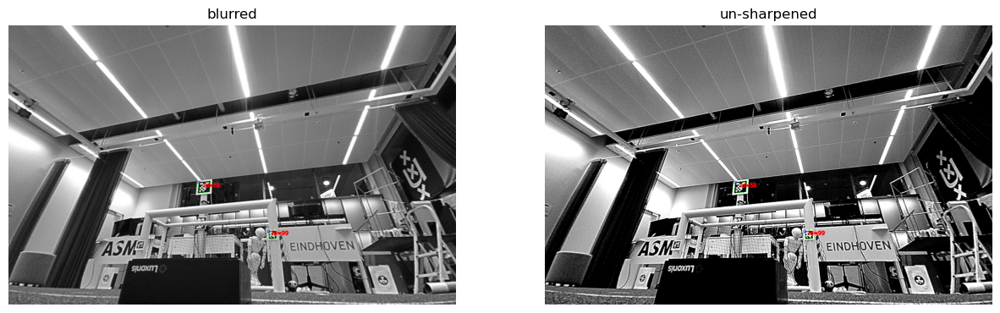

In [8]:
image1 = cv2.imread("report/marker_detection/blurred/image_16.png")
image2 = cv2.imread("report/marker_detection/un_sharpened/image_16.png")


# Create a plot
fig, axes = plt.subplots(1, 2, figsize=(15, 5))  # 1 row, 3 columns

# Display each image in a subplot
axes[0].imshow(image1)
axes[0].axis('off')  # Hide axes
axes[0].set_title('blurred')  # Optional title

axes[1].imshow(image2)
axes[1].axis('off')
axes[1].set_title('un-sharpened')



In [57]:
import cv2
import numpy as np
from itertools import product

def hyperparameter_search(image_paths, kernel_sizes, sigmas, weights_image, weights_blurred, scalars):
    """
    Performs a grid search over hyperparameters for the Gaussian blur and weighted addition.
    
    Parameters:
    - image: The input image to process (numpy array).
    - metric_func: Function to evaluate the result, returning a performance score (higher is better).
    - kernel_sizes: List of kernel sizes for Gaussian blur (e.g., [3, 5, 7]).
    - sigmas: List of sigma values for Gaussian blur (e.g., [1, 2, 5]).
    - weights_image: List of weights for the original image in `cv2.addWeighted` (e.g., [1, 2, 3]).
    - weights_blurred: List of weights for the blurred image in `cv2.addWeighted` (e.g., [-0.5, -1, -2]).
    - scalars: List of scalar values for brightness adjustment in `cv2.addWeighted` (e.g., [0, 10, 20]).
    
    Returns:
    - Best hyperparameters and the corresponding score.
    """
    best_score = -float('inf')  # Initialize with a very low score
    best_params = None

    # Iterate over all possible combinations of hyperparameters
    for ksize, sigma, weight_img, weight_blur, scalar in product(kernel_sizes, sigmas, weights_image, weights_blurred, scalars):
        # Ensure kernel size is odd and greater than 1
        if ksize % 2 == 0 or ksize < 1:
            continue
        score = 0
        for image_path in image_paths:
   
            image = cv2.imread(os.path.join(folder_path,image_path))
            # Apply Gaussian blur
            blurred = cv2.GaussianBlur(image, (ksize, ksize), sigma)
            
            # Combine the original image and blurred image using addWeighted
            processed_image = cv2.addWeighted(image, weight_img, blurred, weight_blur, scalar)
            gray = cv2.cvtColor(processed_image, cv2.COLOR_BGR2GRAY)
    
            retdict = detect_aruco_markers(gray)
        
            for key, desci in RETDICT.items():
                corners, ids, rejectedImgPoints = retdict[key]
                
                if ids is not None:
                    score += len(ids)
                # Evaluate the result using the metric function
    

        # Update the best score and parameters if the current one is better
        if score > best_score:
            best_score = score
            best_params = {
                "kernel_size": ksize,
                "sigma": sigma,
                "weight_image": weight_img,
                "weight_blurred": weight_blur,
                "scalar": scalar
            }

    return best_params, best_score


In [58]:
kernel_sizes = [3, 5, 7]
sigmas = [1, 2, 5]
weights_image = [1, 2, 3]
weights_blurred = [-0.5, -1, -2]
scalars = [0, 10, 20]


In [60]:
best_params, best_score = hyperparameter_search(
    image_paths=img_paths,
    kernel_sizes=kernel_sizes,
    sigmas=sigmas,
    weights_image=weights_image,
    weights_blurred=weights_blurred,
    scalars=scalars
)
print("Best Parameters:", best_params)
print("Best Score:", best_score)


Best Parameters: {'kernel_size': 3, 'sigma': 2, 'weight_image': 1, 'weight_blurred': -0.5, 'scalar': 0}
Best Score: 38


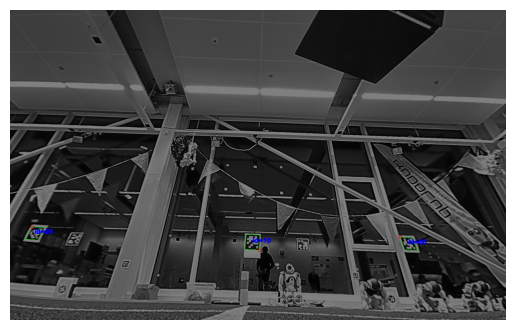

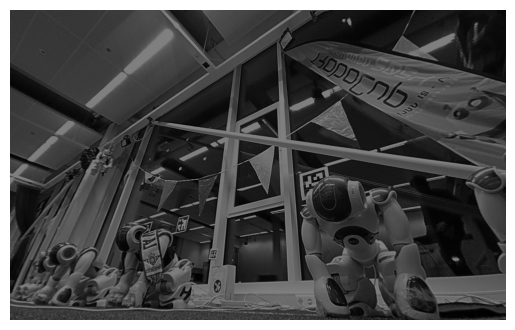

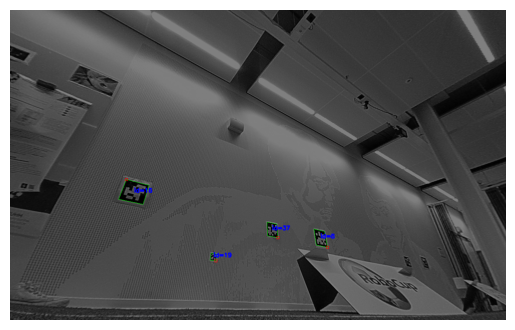

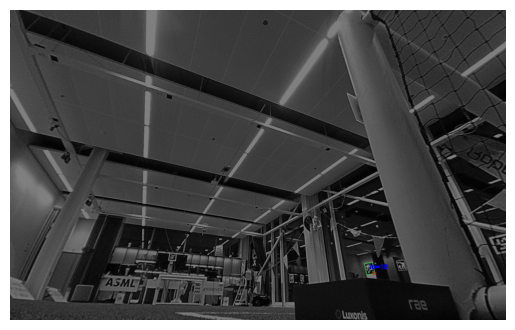

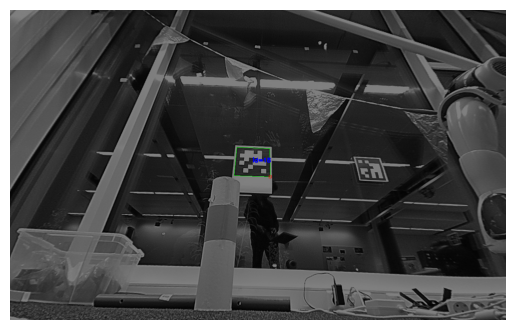

...

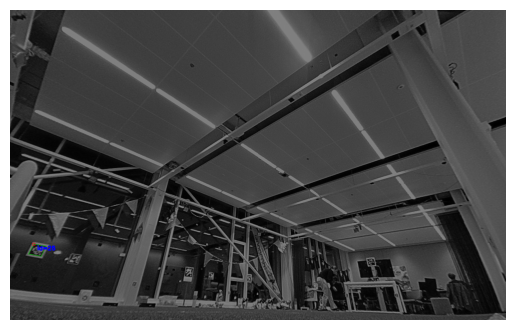

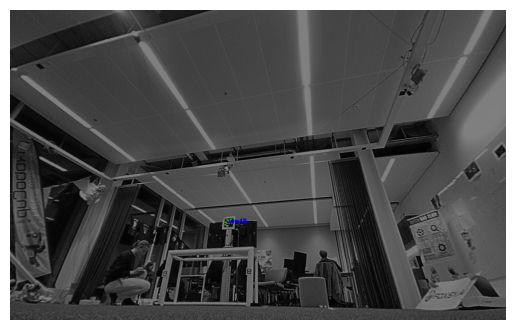

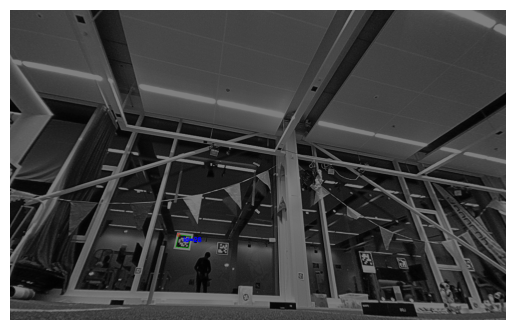

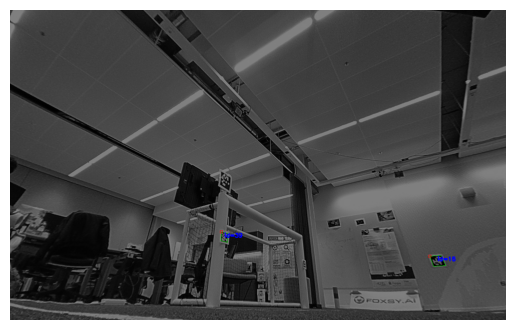

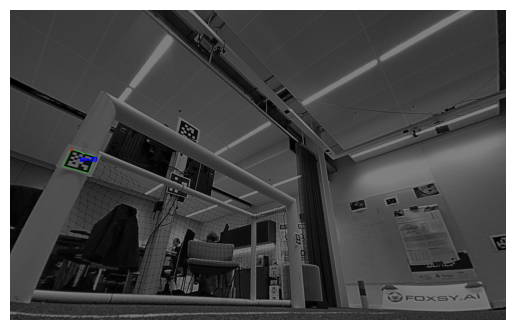

38


In [67]:
total_markers = 0
for img_path in img_paths:
   
    image = cv2.imread(os.path.join(folder_path,img_path))
    
    blurred = cv2.GaussianBlur(image, (3, 3), 2)
    image = cv2.addWeighted(image, 1, blurred, -0.5, 0)

    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    retdict = detect_aruco_markers(gray)

    
    colored_viz = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)  # Convert grayscale to BGR for adding markers
    
    # Draw colored markers
    
    for key, desci in RETDICT.items():
        corners, ids, rejectedImgPoints = retdict[key]
        
        if ids is not None:
            total_markers += len(ids)
            colored_viz = aruco.drawDetectedMarkers(colored_viz, corners, ids)  # Draw markers
    
    # Prepare the grayscale base as 3-channel
    final_viz = np.stack([gray] * 3, axis=-1)  # Convert grayscale to 3-channel RGB
    
    # Create a mask for regions with colored markers
    mask = np.any(colored_viz != final_viz, axis=-1)  # Identify where markers were drawn
    
    # Overlay only the colored parts onto the grayscale base
    final_viz[mask] = colored_viz[mask]
    
    # Display the result
    plt.imshow(final_viz[..., ::-1])  # Convert BGR to RGB for matplotlib
    plt.axis('off')
    plt.show()
    save_path = "report/marker_detection/best/" + img_path
    cv2.imwrite(save_path,final_viz)
print(total_markers)

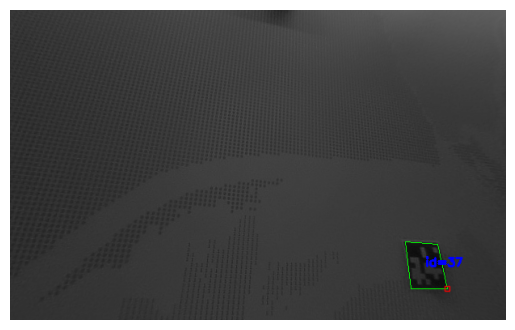

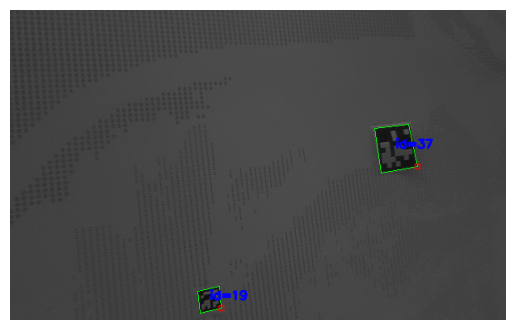

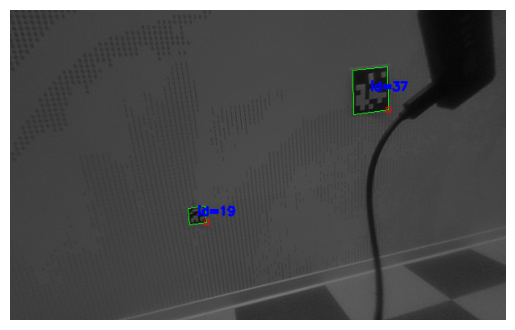

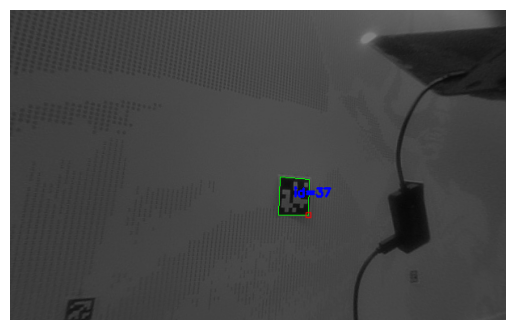

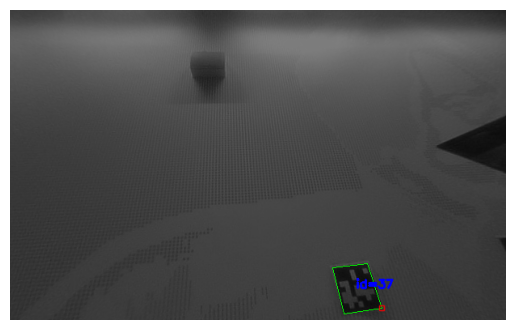

...

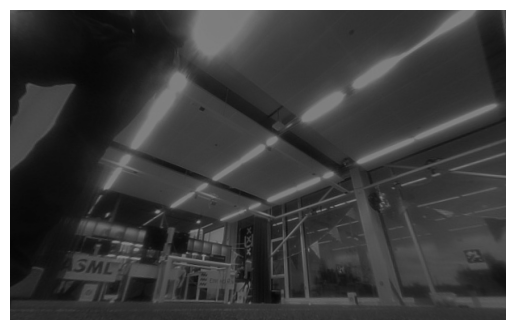

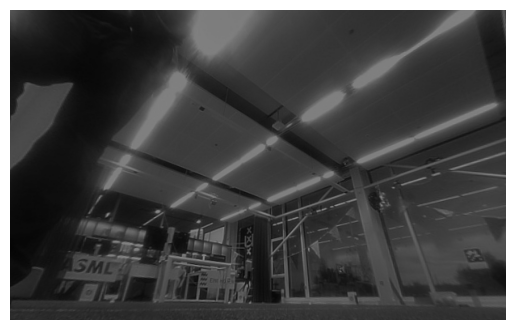

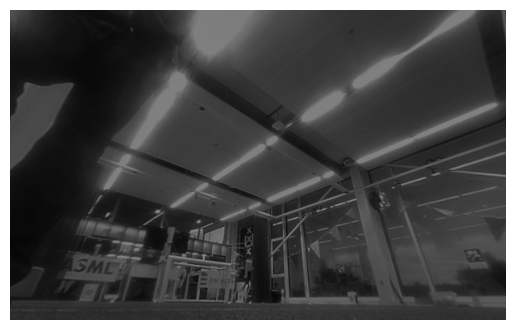

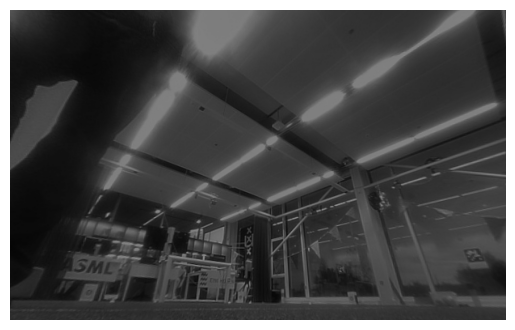

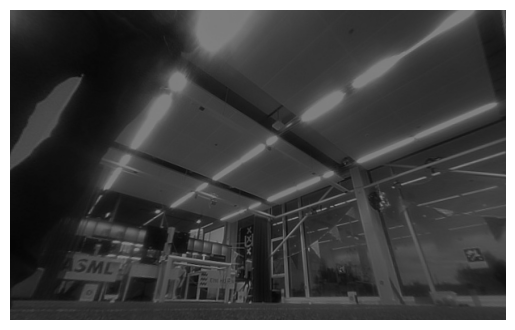

77


In [4]:
total_markers = 0
folder_path_2 = "Archive/"
img_paths_2 = os.listdir(folder_path_2)

for img_path in img_paths_2:
   
    image = cv2.imread(os.path.join(folder_path_2,img_path))
    
    blurred = cv2.GaussianBlur(image, (3, 3), 2)
    image = cv2.addWeighted(image, 1, blurred, -0.5, 0)

    
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    retdict = detect_aruco_markers(gray)

    
    colored_viz = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)  # Convert grayscale to BGR for adding markers
    
    # Draw colored markers
    
    for key, desci in RETDICT.items():
        corners, ids, rejectedImgPoints = retdict[key]
        
        if ids is not None:
            total_markers += len(ids)
            colored_viz = aruco.drawDetectedMarkers(colored_viz, corners, ids)  # Draw markers
    
    # Prepare the grayscale base as 3-channel
    final_viz = np.stack([gray] * 3, axis=-1)  # Convert grayscale to 3-channel RGB
    
    # Create a mask for regions with colored markers
    mask = np.any(colored_viz != final_viz, axis=-1)  # Identify where markers were drawn
    
    # Overlay only the colored parts onto the grayscale base
    final_viz[mask] = colored_viz[mask]
    
    # Display the result
    plt.imshow(final_viz[..., ::-1])  # Convert BGR to RGB for matplotlib
    plt.axis('off')
    plt.show()
    # save_path = "report/marker_detection/best/" + img_path
    # cv2.imwrite(save_path,final_viz)
print(total_markers)